In [5]:
DATA_DIR_BASE = "data"


import math

from IPython.display import display, Markdown
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import scipy.ndimage
import skimage.feature
import skimage.io
import skimage.transform

import fns

run_names, bg_paths, fg_pathses, gt_data = fns.load_all(
    data_dir_base=DATA_DIR_BASE)

In [2]:
import importlib

import preprocessing


importlib.reload(preprocessing)

<module 'preprocessing' from '/Users/jenny.vophamhi/Desktop/CZB/others/from_greg/2021-07-15 sw counts vs gt vis 20210913/preprocessing.py'>

# Data dir summary

In [3]:
num_fg_paths = 0
num_fg_matched = 0
all_fg_paths = {} # List of FG image paths per run name
for run_name in run_names:
    all_fg_paths[run_name] = [
       x for lane_no in fg_pathses[run_name]
       for x in fg_pathses[run_name][lane_no]]
    num_fg_paths += len(all_fg_paths[run_name])

for run_name in run_names:
    print(f"Run {run_name}:")
    print(f"  BG Lanes:        {','.join(str(x) for x in bg_paths[run_name])}")
    print(f"  Num FG images:   {len(all_fg_paths[run_name])}")
    n_matched = sum(len(x) for x in gt_data[run_name].values()) \
                if run_name in gt_data else 0
    num_fg_matched += n_matched
    print(f"  Num matched GTs: {n_matched}")

unm_gt_ids = ()
if None in gt_data:
    print()
    print("Unmatched GTs:")
    unm_gt_ids = [
        f"  {ts}-{lane_no}"
        for lane_no in gt_data[None]
        for ts in gt_data[None][lane_no]]
    print("\n".join(unm_gt_ids))

print()
print(f"Total FG images:        {num_fg_paths}")
print(f"Total GT files:         {num_fg_matched + len(unm_gt_ids)}")
print(f"Total matched GT files: {num_fg_matched}")

Run 20201217:
  BG Lanes:        5,4,6,7,3,2,0,1
  Num FG images:   8
  Num matched GTs: 4
Run 20201216:
  BG Lanes:        5,4,6,7,3,2,0,1
  Num FG images:   40
  Num matched GTs: 10
Run 20200901:
  BG Lanes:        0,1,3,2,6,7,5,4
  Num FG images:   32
  Num matched GTs: 16
Run 20200916b:
  BG Lanes:        6,7,5,4,0,1,3,2
  Num FG images:   24
  Num matched GTs: 5
Run 20200916a:
  BG Lanes:        5,4,6,7,3,2,0,1
  Num FG images:   16
  Num matched GTs: 5

Unmatched GTs:
  20201002-150536-6
  20201002-132522-6
  20201002-135404-6
  20201002-142245-6
  20201002-140824-4
  20201002-150536-4
  20201002-131101-4
  20201002-132522-4
  20201002-135404-4
  20201002-133942-4
  20201002-145125-4
  20201002-125630-4
  20201002-142245-4
  20201002-131101-2
  20201002-132522-2
  20201002-140824-2
  20201002-135404-2
  20201002-133942-2
  20201002-142245-2
  20201002-125630-2
  20201002-132522-3
  20201002-131101-3
  20201002-135404-3
  20201002-145125-3
  20201002-133942-3
  20201002-142245-3
 

# GT visualization

## Run: `20201217`

### Lane 0

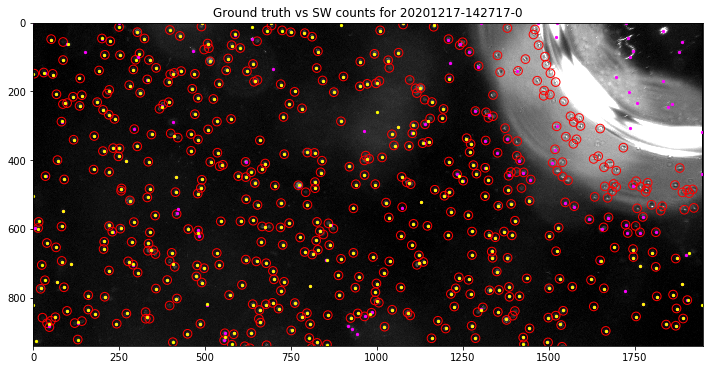

gt_xs:	 519
xs:	 443
pp_xs:	 399


### Lane 2

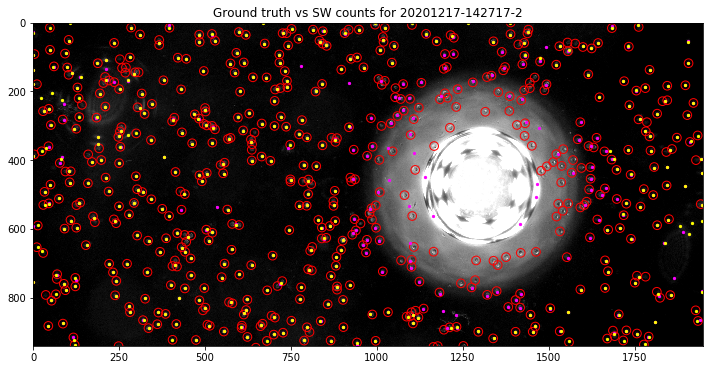

gt_xs:	 568
xs:	 457
pp_xs:	 394


### Lane 4

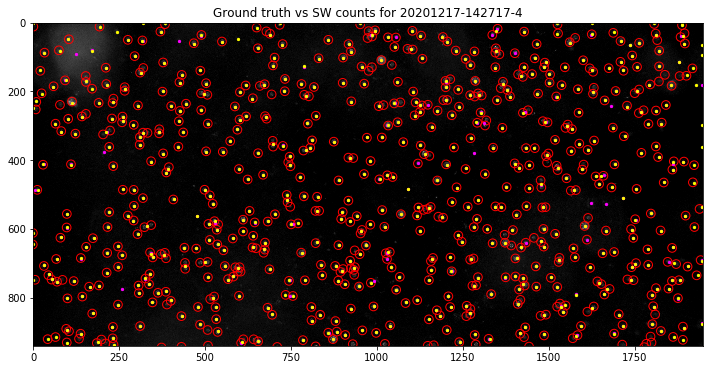

gt_xs:	 674
xs:	 555
pp_xs:	 575


### Lane 5

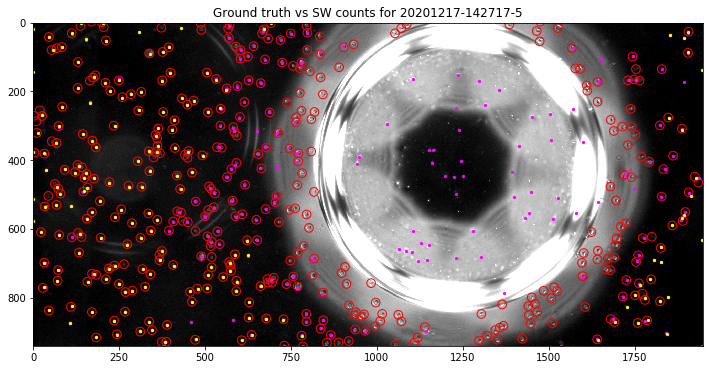

gt_xs:	 410
xs:	 320
pp_xs:	 190


## Run: `20201216`

### Lane 1

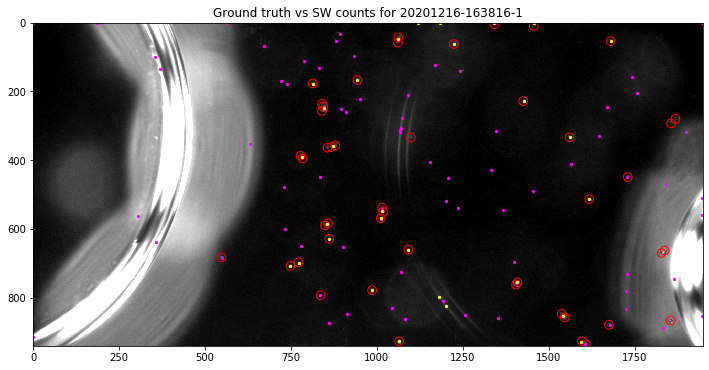

gt_xs:	 46
xs:	 96
pp_xs:	 33


### Lane 2

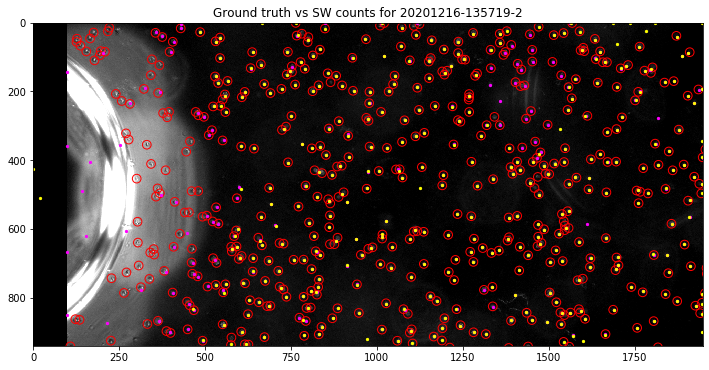

gt_xs:	 514
xs:	 427
pp_xs:	 378


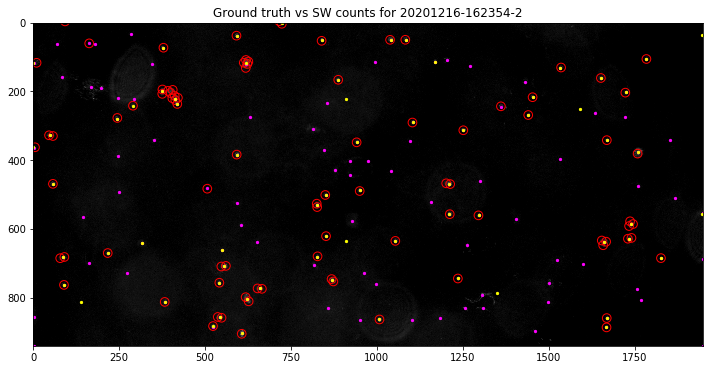

gt_xs:	 88
xs:	 130
pp_xs:	 68


### Lane 3

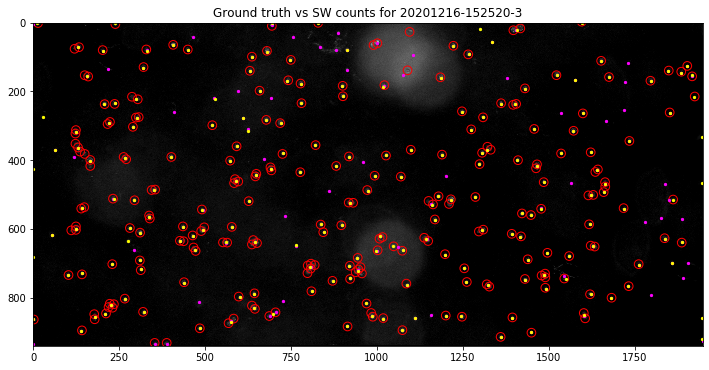

gt_xs:	 251
xs:	 241
pp_xs:	 210


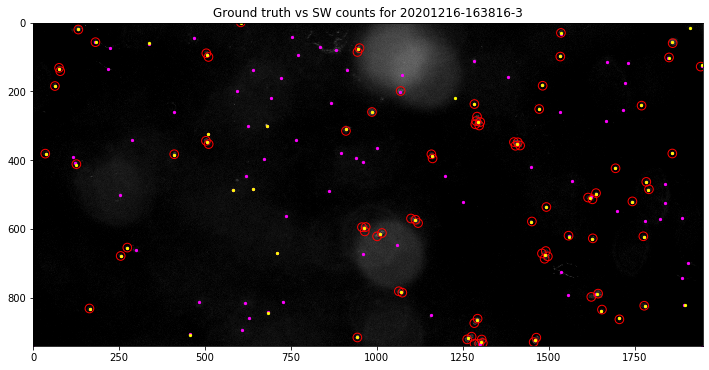

gt_xs:	 84
xs:	 126
pp_xs:	 65


### Lane 5

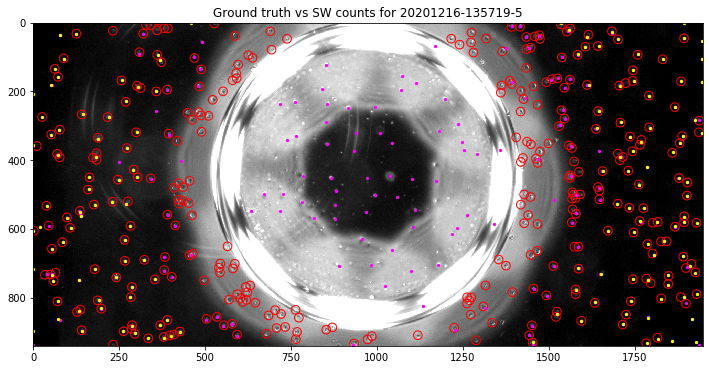

gt_xs:	 332
xs:	 261
pp_xs:	 161


### Lane 6

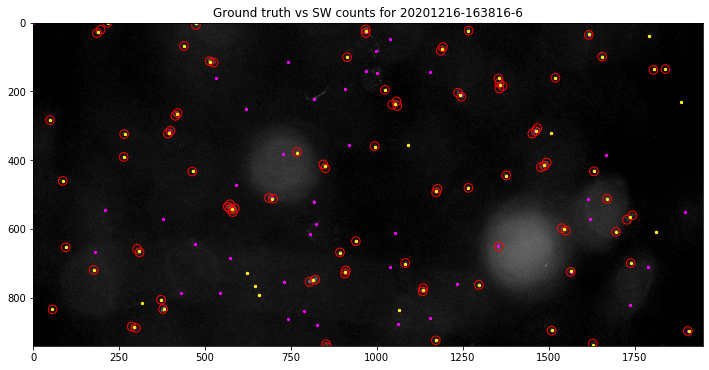

gt_xs:	 93
xs:	 113
pp_xs:	 72


### Lane 7

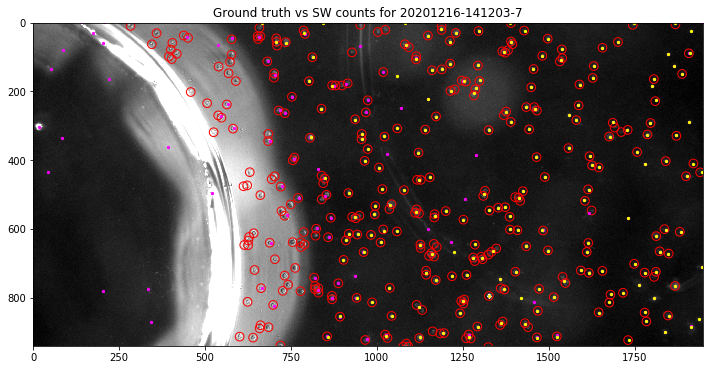

gt_xs:	 331
xs:	 252
pp_xs:	 201


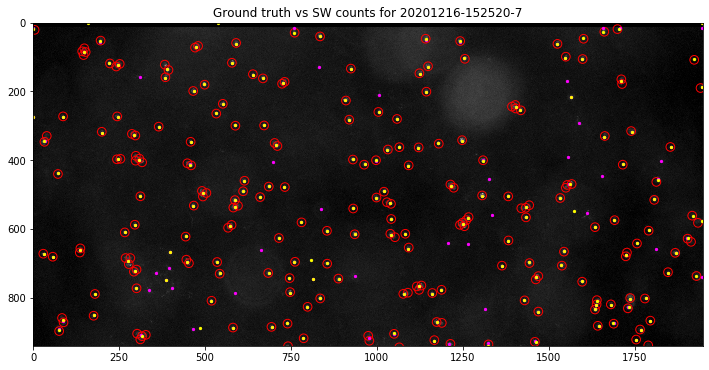

gt_xs:	 230
xs:	 205
pp_xs:	 190


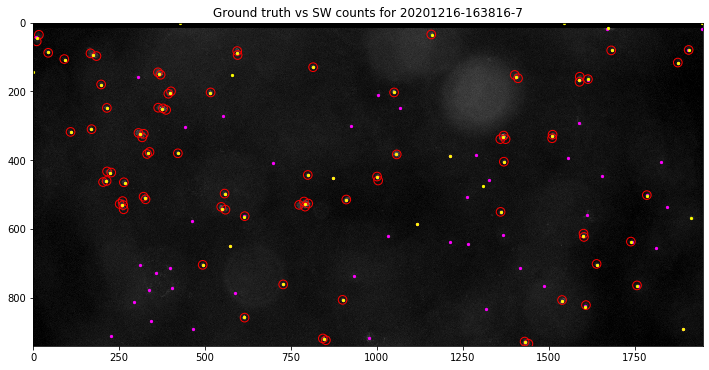

gt_xs:	 84
xs:	 99
pp_xs:	 68


## Run: `20200901`

### Lane 0

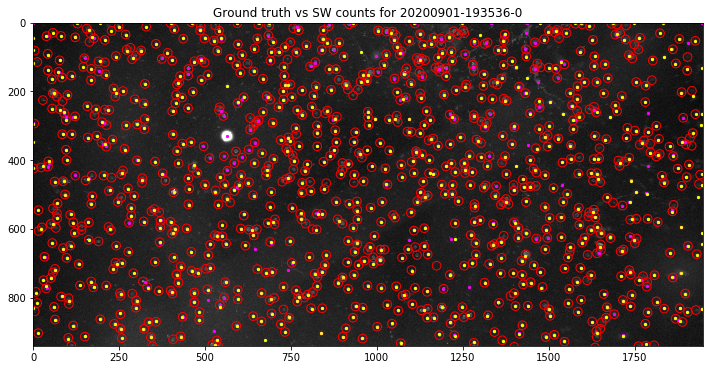

gt_xs:	 977
xs:	 770
pp_xs:	 778


### Lane 1

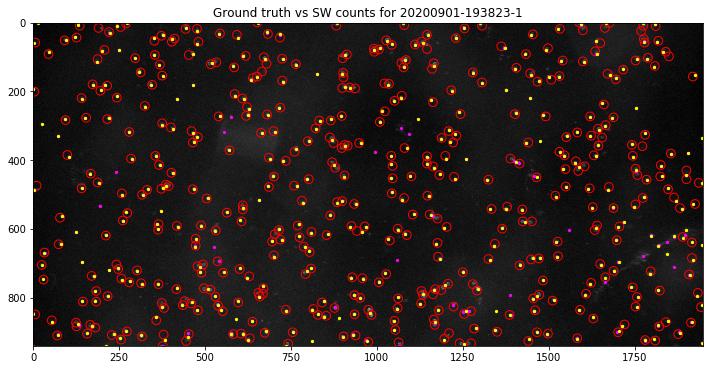

gt_xs:	 450
xs:	 415
pp_xs:	 433


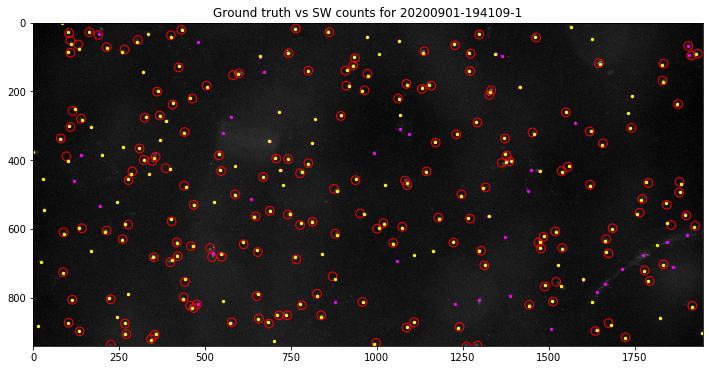

gt_xs:	 188
xs:	 240
pp_xs:	 231


### Lane 2

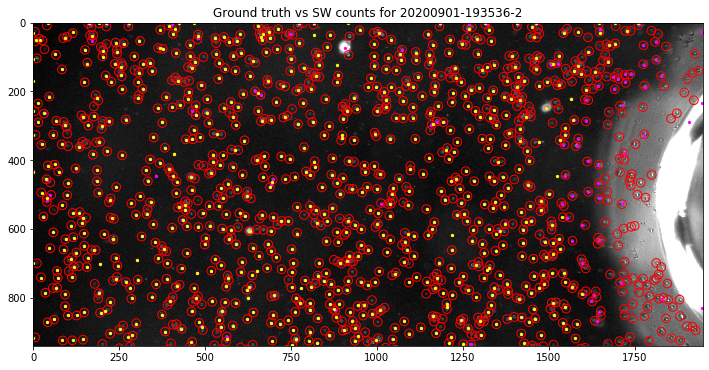

gt_xs:	 1135
xs:	 753
pp_xs:	 752


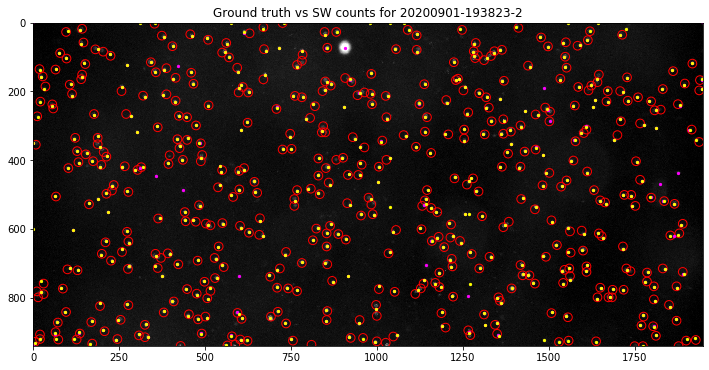

gt_xs:	 460
xs:	 437
pp_xs:	 465


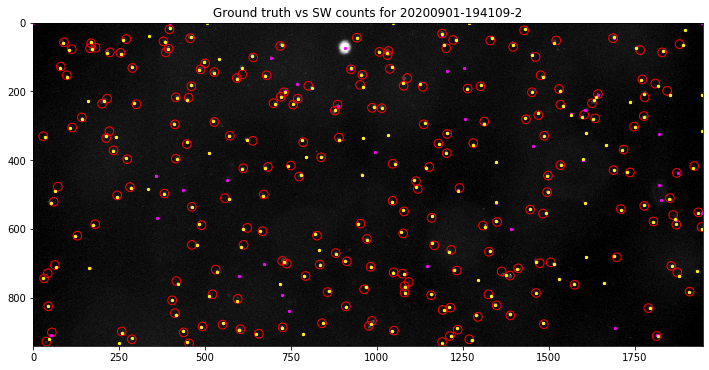

gt_xs:	 224
xs:	 261
pp_xs:	 250


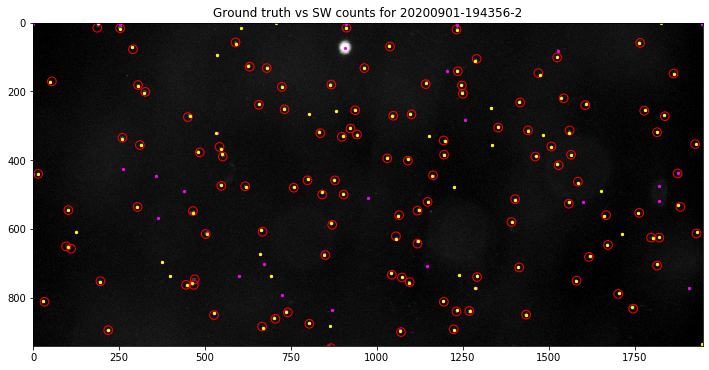

gt_xs:	 120
xs:	 154
pp_xs:	 142


### Lane 3

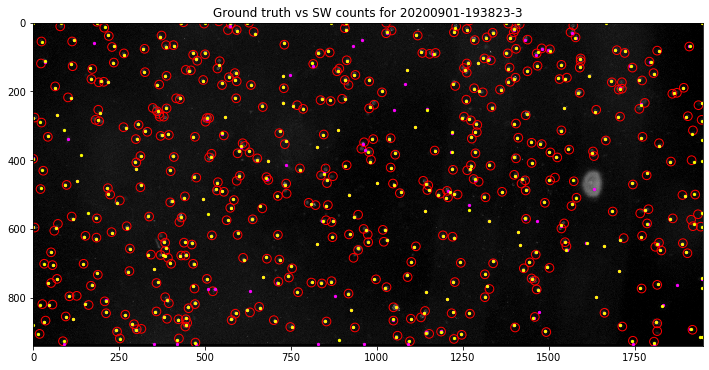

gt_xs:	 448
xs:	 430
pp_xs:	 448


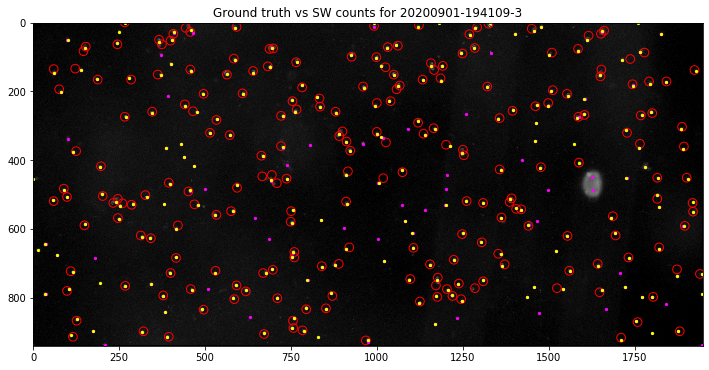

gt_xs:	 221
xs:	 270
pp_xs:	 255


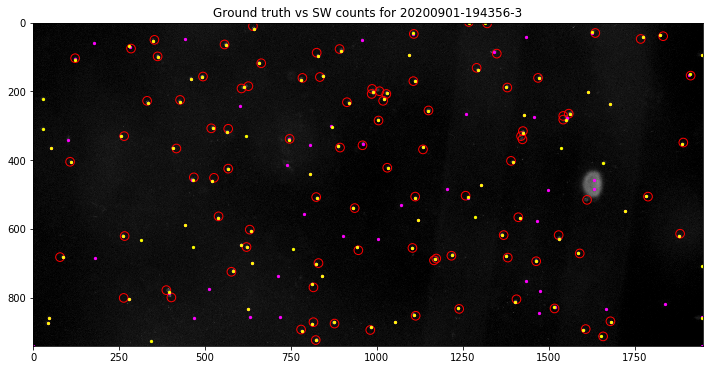

gt_xs:	 98
xs:	 142
pp_xs:	 121


### Lane 5

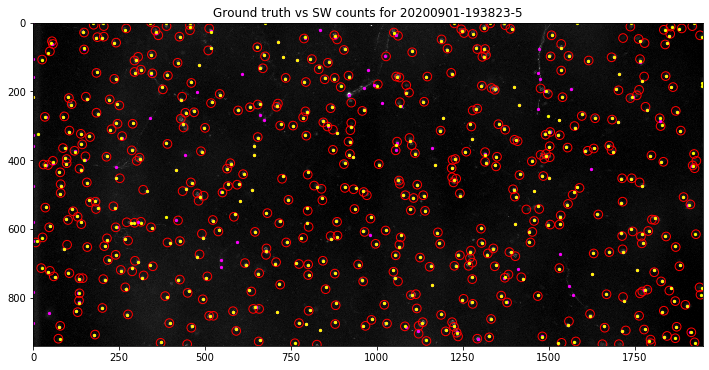

gt_xs:	 485
xs:	 475
pp_xs:	 463


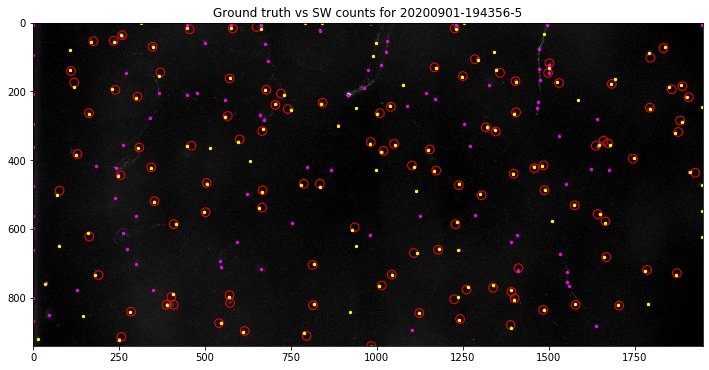

gt_xs:	 115
xs:	 207
pp_xs:	 142


### Lane 6

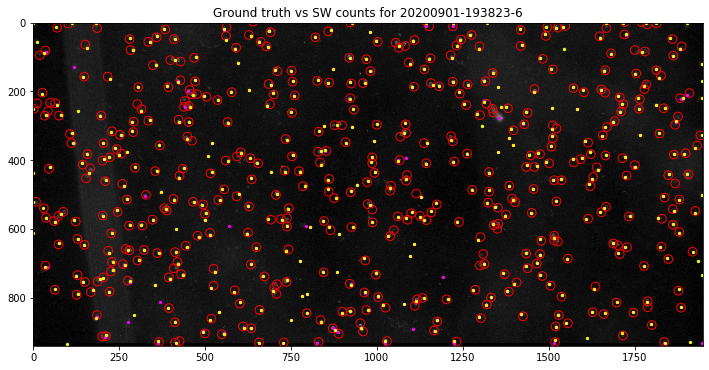

gt_xs:	 457
xs:	 441
pp_xs:	 460


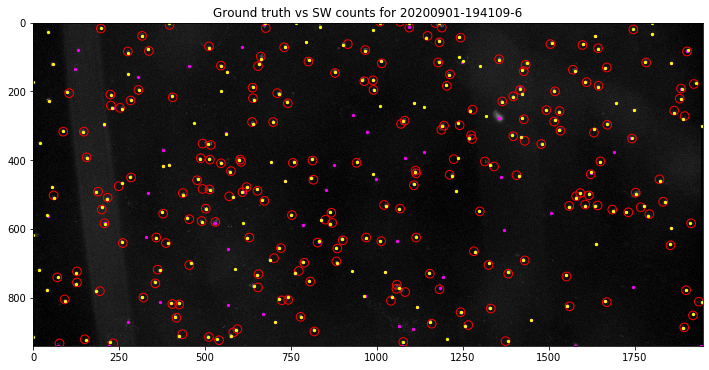

gt_xs:	 217
xs:	 264
pp_xs:	 259


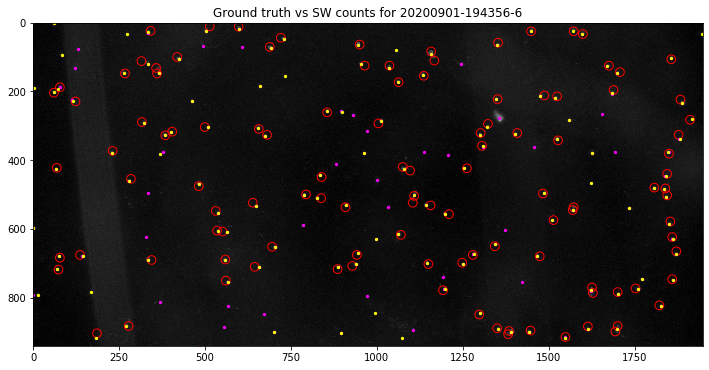

gt_xs:	 113
xs:	 146
pp_xs:	 136


### Lane 7

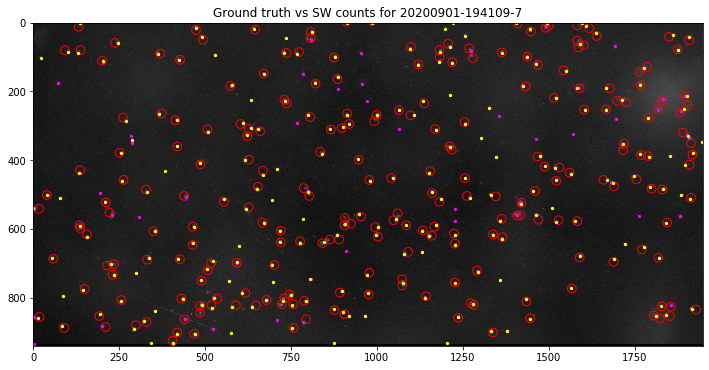

gt_xs:	 239
xs:	 258
pp_xs:	 244


## Run: `20200916b`

### Lane 0

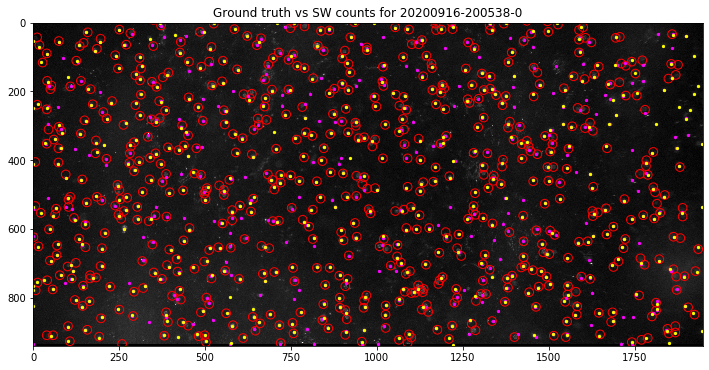

gt_xs:	 658
xs:	 661
pp_xs:	 534


### Lane 5

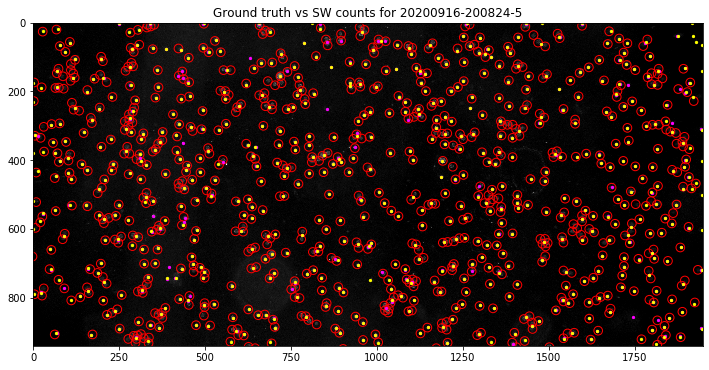

gt_xs:	 847
xs:	 609
pp_xs:	 623


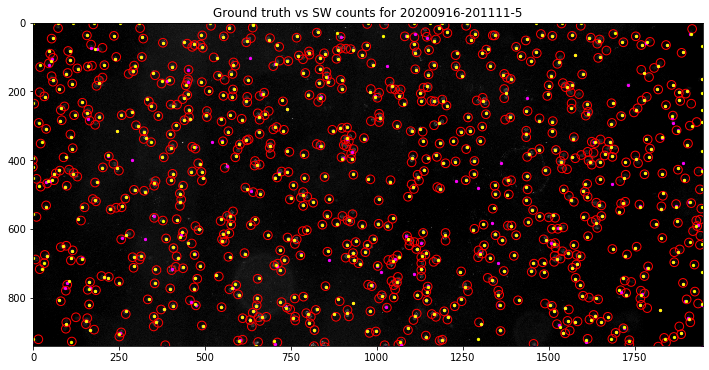

gt_xs:	 804
xs:	 616
pp_xs:	 629


### Lane 6

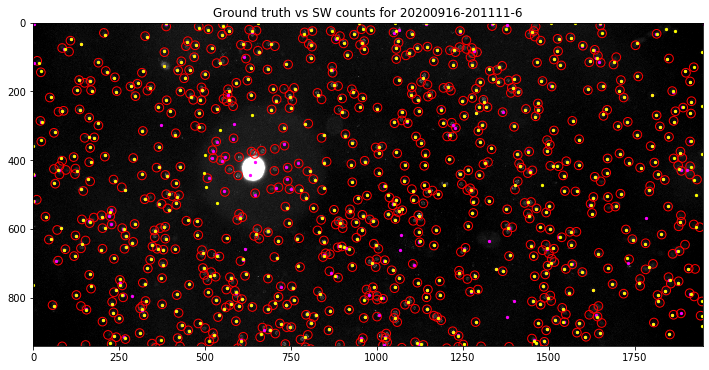

gt_xs:	 756
xs:	 594
pp_xs:	 600


### Lane 7

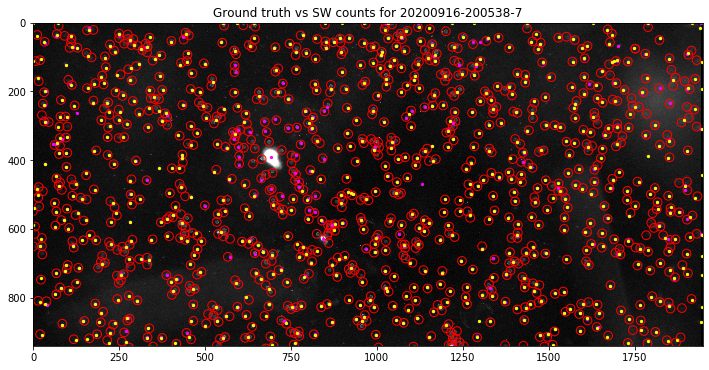

gt_xs:	 1010
xs:	 708
pp_xs:	 727


## Run: `20200916a`

### Lane 1

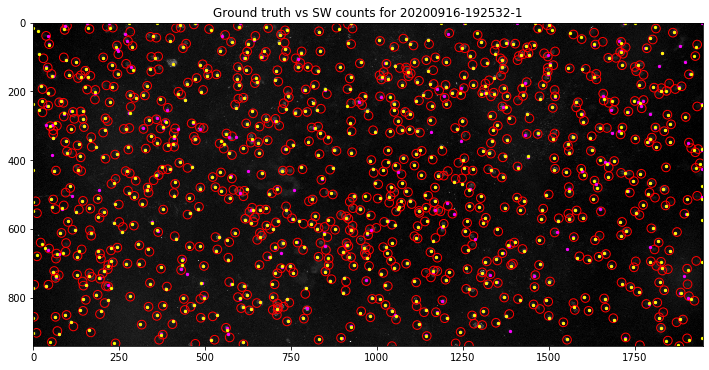

gt_xs:	 882
xs:	 714
pp_xs:	 716


### Lane 2

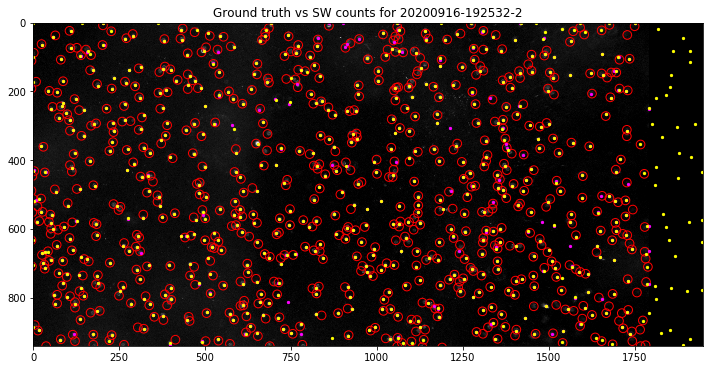

gt_xs:	 753
xs:	 647
pp_xs:	 654


### Lane 4

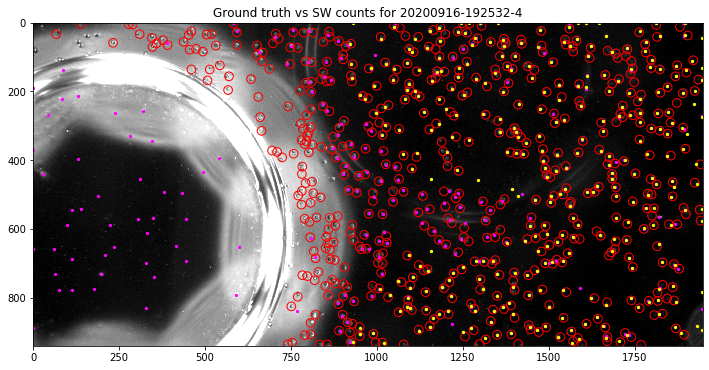

gt_xs:	 579
xs:	 445
pp_xs:	 333


### Lane 5

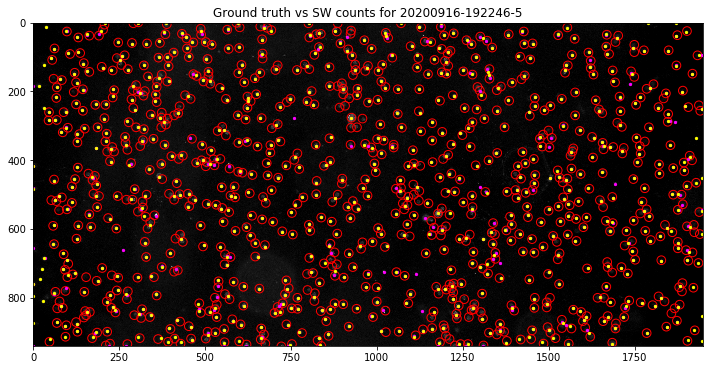

gt_xs:	 904
xs:	 724
pp_xs:	 741


### Lane 7

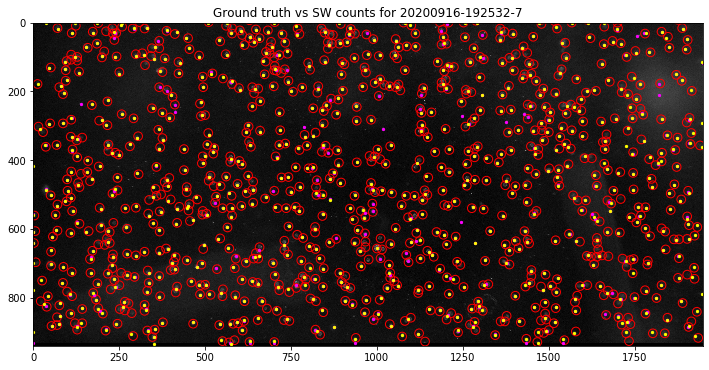

gt_xs:	 927
xs:	 724
pp_xs:	 753


In [4]:
DOWNSAMPLE_FACTOR = 2
KERNEL_SIZE = 150
DISC_RADIUS = 3

pp_params = {
    "input_rescale_factor":   None,
    "input_gaussian_sigma":   None,
    "align_bg_pixel_thresh":  0.25,
    "align_bg_row_thresh":    0.35,
    "align_mask_margin":      0.01,
    "align_cutout_height":    0.75,
    "align_oversub_factor":   1.05,
    "cleanup_wall_margin":    0.05,
    "cleanup_bg_brt_thresh":  0.25,
    "cleanup_bg_grow_factor": 1.0e-2,
    "cleanup_fg_brt_thresh":  0.05,
    "cleanup_fg_grow_factor": 1.0e-2,
    "cleanup_fg_grow_cycles": 4,
    "cleanup_fg_size_thresh": 3.0e-4,
    "cleanup_gaussian_sigma": None,
}


def crop_image(img):
    ycrop = int((2048-948)/2)
    xcrop = int((2448-1948)/2)
    return img[ycrop:-1*ycrop,xcrop:-1*xcrop]

def cross_correlate(img, kernel):
    cc_img = skimage.feature.match_template(img, kernel, pad_input=True)
    cc_img[cc_img < 0.] = 0.
    return cc_img

def get_kernel():
    kernel = np.zeros((KERNEL_SIZE, KERNEL_SIZE), 'uint16')
    kernelCtr = KERNEL_SIZE / 2
    for rr in range(0, KERNEL_SIZE + 1):
        for cc in range(0, KERNEL_SIZE + 1):
            if  math.sqrt((rr - kernelCtr)**2 + (cc - kernelCtr)**2) < DISC_RADIUS:
                kernel[rr, cc] = 65535
    return skimage.transform.downscale_local_mean(
        kernel, (DOWNSAMPLE_FACTOR,DOWNSAMPLE_FACTOR))

def find_blobs(cc_img):
    return skimage.feature.blob_dog(
        cc_img, min_sigma=5, max_sigma=15, threshold=0.08, overlap=0.8)



kernel = get_kernel()

gt_xs_list, xs_list, pp_xs_list = [], [], []
run_name_list, lane_no_list, ts_list = [], [], []

for run_name in run_names:
    if run_name not in gt_data:
        continue
    display(Markdown(f'## Run: `{run_name}`'))
    for lane_no in sorted(gt_data[run_name].keys()):
        pp = preprocessing.Cci1ImagePreprocessing(**pp_params)
        pp.set_bg_image_from_path(bg_paths[run_name][lane_no])
        display(Markdown(f'### Lane {lane_no}'))
        for ts in sorted(gt_data[run_name][lane_no].keys()):
            plt.figure(figsize=(12.,12.))

            pp_img, valid_area, info = pp.process_fg_image_from_path(
                fg_pathses[run_name][lane_no][ts])

            pp_cc_img = cross_correlate(crop_image(pp_img), kernel)
            pp_ys, pp_xs, pp_sigmas = zip(*(find_blobs(pp_cc_img)))

            cc_img = cross_correlate(crop_image(info["fg_image"]), kernel)
            ys, xs, sigmas = zip(*(find_blobs(cc_img)))
            ys += info["shift"][0]
            xs += info["shift"][1]

            gt_ys, gt_xs = zip(*gt_data[run_name][lane_no][ts])
            gt_ys += info["shift"][0]
            gt_xs += info["shift"][1]

            # Shift image and compress dynamic range for display
            disp_img = scipy.ndimage.shift(
                crop_image(info["fg_image"]) ** 0.5, info["shift"])
            plt.imshow(disp_img, cmap=plt.cm.gray, vmin=0.3, vmax=1.)
            plt.scatter(gt_xs, gt_ys, s=75., facecolors='none', edgecolors='red')
            plt.scatter(xs, ys, s=5., facecolors='magenta')
            plt.scatter(pp_xs, pp_ys, s=5., facecolors='yellow')
                        
            plt.title(f"Ground truth vs SW counts for {ts}-{lane_no}")
            plt.xlim(0, 1948)
            plt.ylim(940, 0)
            plt.show()
            
            gt_xs_list.append(len(gt_xs))
            xs_list.append(len(xs))
            pp_xs_list.append(len(pp_xs))
            run_name_list.append(run_name)
            lane_no_list.append(lane_no)
            ts_list.append(ts)
            
            print('gt_xs:\t', len(gt_xs))
            print('xs:\t', len(xs))
            print('pp_xs:\t', len(pp_xs))


In [8]:
data_table = pd.DataFrame({
    'gt_xs': gt_xs_list,
    'xs': xs_list,
    'pp_xs': pp_xs_list,
    'run_name': run_name_list,
    'lane_no': lane_no_list,
    'ts': ts_list,
})
data_table.to_csv('pred_gt_counts_gc.csv', index=None)

In [9]:
data_table

,gt_xs,xs,pp_xs,run_name,lane_no,ts
0,519,443,399,20201217,0,20201217-142717
1,568,457,394,20201217,2,20201217-142717
2,674,555,575,20201217,4,20201217-142717
3,410,320,190,20201217,5,20201217-142717
4,46,96,33,20201216,1,20201216-163816
5,514,427,378,20201216,2,20201216-135719
6,88,130,68,20201216,2,20201216-162354
7,251,241,210,20201216,3,20201216-152520
8,84,126,65,20201216,3,20201216-163816
9,332,261,161,20201216,5,20201216-135719
